In [21]:
import torch
import torchvision
from torch.nn.functional import cross_entropy, mse_loss
from torchvision.transforms import v2
import numpy as np
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Subset
from torchvision.utils import make_grid
from tqdm import trange, tqdm
from geometry_tools import lerp, slerp
from utils import categorical_entropy, get_random_image, get_random_images, get_random_images_of_classes, get_random_images_w_labels
from sklearn.mixture import GaussianMixture
from utils import NestedDiagonalGMM
from posterior_manifold import FisherLogPosteriorManifold
from conformal_ebm import optimize_ebm_geodesic
from conformal_ebm_new import optimize_ebm_geodesic as optimize_ebm_geodesic_new
from decoder_geometry import DecoderManifold
from conditional_gmm import ConditionalGMM
from evaluation_metrics import curve_true_pos, curve_false_pos
from riemannian_geometry import PullbackRiemannianManifold, NestedPullbackManifold
import normflows as nf

transform = v2.Compose([
    v2.Resize((128, 128), interpolation=v2.InterpolationMode.BICUBIC),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])
def show_img(img, figsize=None, ax=None):
    if not ax:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot()
    img = img.detach()
    img = F.to_pil_image(img)
    ax.imshow(np.asarray(img), cmap='gray')
    ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [2]:
# bright_indices = torch.load('pickled_objects/bright_indices.pt')
top_indices = torch.load('pickled_objects/top_indices_loss.pt')
celeba = torchvision.datasets.CelebA(root='datasets', split='all', transform=transform, download=False)
celeba = Subset(celeba, top_indices)
celeba_loader = DataLoader(celeba, batch_size=16, shuffle=False, num_workers=4)

/tmp/user/5678/ipykernel_3947193/1133015803.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  top_indices = torch.load('pickled_objects/top_indices_loss.pt')


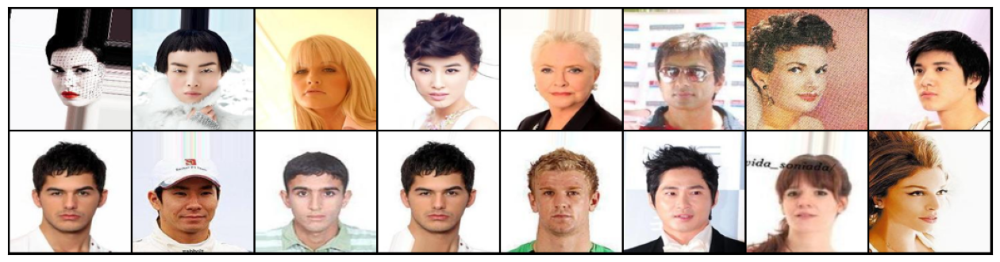

In [3]:
imgs, labels = next(celeba_loader.__iter__())
show_img(make_grid(imgs), figsize=(16, 8))

In [4]:
from pretrained_models import NestedVAE
vae = NestedVAE()

/usr/people/robertwiebe/testvenv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/usr/people/robertwiebe/testvenv/lib/python3.11/site-packages/huggingface_hub/utils/_validators.py:206: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/net/st1/export/clusterhome/robertwiebe/ml_geometry_project/pretrained_models.py:280: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future relea

In [5]:
from matplotlib.ticker import MultipleLocator
def show_latent_curve(curve: torch.Tensor, title=None, ax=None):
    if not ax:
        fig = plt.figure(figsize=(12, 1.25))
        ax = fig.add_subplot()
    img = make_grid(vae.decode(curve), nrow=curve.shape[0])
    img = F.to_pil_image(img)
    ax.imshow(np.asarray(img), cmap='gray', extent=(0, 1, 0, 1/len(curve)))
    ax.yaxis.set_visible(False)
    ax.spines["left"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.spines["bottom"].set_visible(True)
    ax.xaxis.set_major_locator(MultipleLocator(0.1))
    # ax.set_xlim(0, 1)
    if title: ax.set_title(title)

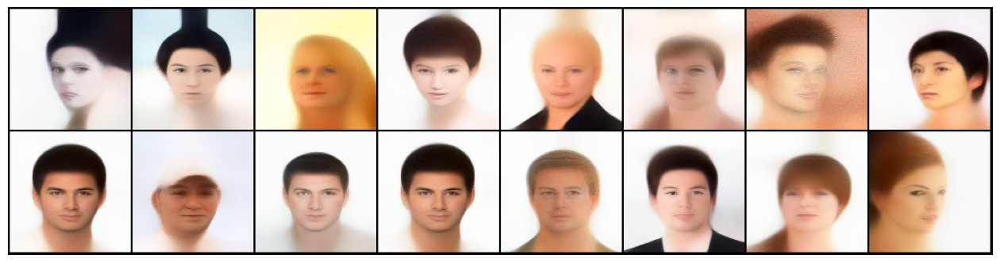

In [6]:
show_img(make_grid(vae.reconstruct(imgs)), figsize=(16, 6))

In [7]:
nested_gmm_params = torch.load('trained_checkpoints/celeba_nested_nested_gmm_4.pt')
# nested_gmm_params = torch.load('trained_checkpoints/celeba_8k_gmm_4.pt')
nested_gmm = NestedDiagonalGMM(
    means=nested_gmm_params['means'],
    variances=nested_gmm_params['variances'],
    subweights=nested_gmm_params['subweights'],
    supweights=nested_gmm_params['supweights'],
)
M = FisherLogPosteriorManifold(nested_gmm.log_posterior)

/tmp/user/5678/ipykernel_3947193/3923970949.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  nested_gmm_params = torch.load('trained_checkpoints/celeba_nested_nested_gmm_

In [8]:
M_Dec = DecoderManifold(vae.decode)

In [8]:
attribute_names = ["5_o_Clock_Shadow", "Arched_Eyebrows", "Attractive", "Bags_Under_Eyes", "Bald", "Bangs", "Big_Lips", "Big_Nose", "Black_Hair", "Blond_Hair", "Blurry", "Brown_Hair", "Bushy_Eyebrows", "Chubby", "Double_Chin", "Eyeglasses", "Goatee", "Gray_Hair", "Heavy_Makeup", "High_Cheekbones", "Male", "Mouth_Slightly_Open", "Mustache", "Narrow_Eyes", "No_Beard", "Oval_Face", "Pale_Skin", "Pointy_Nose", "Receding_Hairline", "Rosy_Cheeks", "Sideburns", "Smiling", "Straight_Hair", "Wavy_Hair", "Wearing_Earrings", "Wearing_Hat", "Wearing_Lipstick", "Wearing_Necklace", "Wearing_Necktie", "Young"]

In [9]:
def show_posterior(curve: torch.Tensor, log_posterior, title=None, ax=None, top_n_labels: int | None = None):
    with torch.no_grad():
        posterior = torch.exp(log_posterior(curve.cuda()).cpu())
    if not ax:
        fig = plt.figure()
        ax = fig.add_subplot()
    if top_n_labels:
        prominence = posterior.sum(dim=0)
        order = prominence.sort(descending=True).indices
        top, others = order[:top_n_labels], order[top_n_labels:]
        ax.plot(
            posterior[:, top],
            label=[attribute_names[i] for i in top]
        )
        ax.plot(posterior[:, others], c='gray')
        ax.legend()
    else:
        ax.plot(posterior)
    if title: ax.set_title(title)

In [12]:
def get_two_bright_images(brightness_threshold = 0.5):
    while True:
        random_imgs = get_random_images(celeba, n=2) #type:ignore
        if torch.all(random_imgs.mean(dim=(1, 2, 3)) >= brightness_threshold): return random_imgs

In [10]:
from torchvision.datasets import VisionDataset
def get_random_images_w_labels(dataset: VisionDataset, n=3):
    loader = DataLoader(dataset, batch_size=n, shuffle=True)
    imgs, labels = next(iter(loader))
    return imgs, labels
def get_two_bright_images_w_labels(brightness_threshold = 0.5):
    while True:
        random_imgs, labels = get_random_images_w_labels(celeba, n=2) #type:ignore
        if torch.all(random_imgs.mean(dim=(1, 2, 3)) >= brightness_threshold): return random_imgs, labels

In [ ]:
from attribute_prediction_model.model import model as attribute_model
attribute_model.load_state_dict(torch.load('attribute_prediction_model/checkpoints/best_checkpoint.pt')['model_state_dict'])
attribute_model = attribute_model.cuda()

## Reparameterization invariance evaluation

### setting up the reparameterization

In [26]:
num_layers = 42
flows = []
for i in range(num_layers):
    # Neural network with two hidden layers having 64 units each
    # Last layer is initialized by zeros making training more stable
    param_map = nf.nets.MLP([32, 16, 16, 64], init_zeros=False)
    # Add flow layer
    flows.append(nf.flows.AffineCouplingBlock(param_map))
    # Swap dimensions
    flows.append(nf.flows.Permute(64, mode='shuffle'))

# Construct flow model
reparam_model = nf.NormalizingFlow(None, flows)

In [13]:
def extended_batching(func):
    def new_func(x: torch.Tensor) -> torch.Tensor:
        return func(x.reshape(-1, x.shape[-1])).reshape_as(x)
    return new_func

In [27]:
reparam = extended_batching(reparam_model.forward)
reparam_inverse = extended_batching(reparam_model.inverse)

In [39]:
reparam_model_gpu = reparam_model.cuda()
M_prime = NestedPullbackManifold(M, reparam_model_gpu.inverse)

### Testing the reparameterization

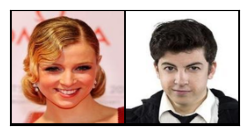

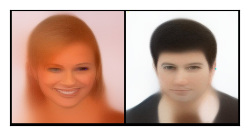

In [21]:
random_imgs = get_two_bright_images() #type:ignore
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

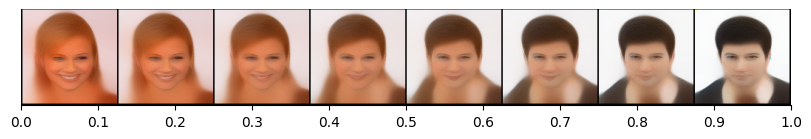

In [22]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

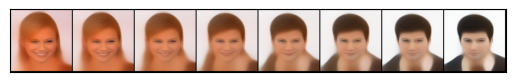

In [23]:
with torch.no_grad():
    line1 = make_grid(vae.decode(lerp(*vae.encode(random_imgs), n=8)))
    show_img(line1)

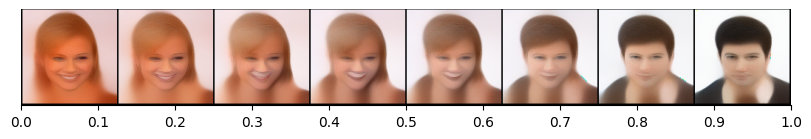

In [28]:
linline_prime = reparam_inverse(lerp(*reparam(vae.encode(random_imgs)), n=8))
show_latent_curve(linline_prime)

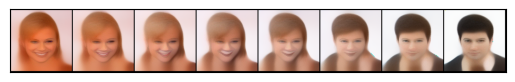

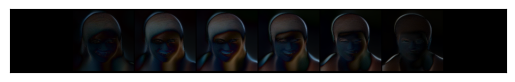

In [29]:
with torch.no_grad():
    line2 = make_grid(vae.decode(reparam_inverse(lerp(*reparam(vae.encode(random_imgs)), n=8))))
    show_img(line2)
    show_img(torch.abs(line1 - line2))

optimizing geodesic:   0%|          | 0/10000 [00:00<?, ?it/s, loss=1.27]

optimizing geodesic: 100%|██████████| 10000/10000 [00:33<00:00, 299.85it/s, loss=0.376]


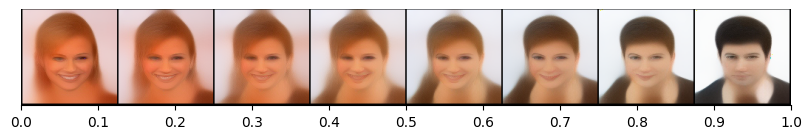

In [48]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000, lr=1e-4)
show_latent_curve(geodesic)

In [49]:
geodesic_prime = reparam_inverse(M_prime.optimize_geodesic(*reparam(vae.encode(random_imgs.cuda())), n_segments=8, n_subdiv=3, n_iter=2000, lr=1e-4)).cpu()

optimizing geodesic:   0%|          | 2/2000 [00:00<01:48, 18.35it/s, loss=1.91]

optimizing geodesic: 100%|██████████| 2000/2000 [01:44<00:00, 19.14it/s, loss=0.639]


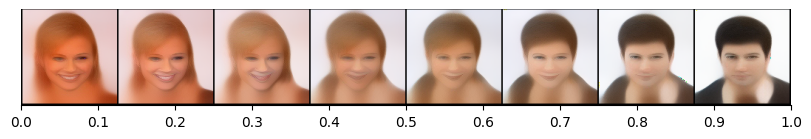

In [50]:
show_latent_curve(geodesic_prime)

In [43]:
mse = torch.nn.MSELoss()

In [46]:
mse(linline_prime, linline).detach()

tensor(0.0980)

In [51]:
mse(geodesic_prime, geodesic)

tensor(0.1544, grad_fn=<MseLossBackward0>)

In [67]:
torch.mean(torch.square(linline - linline_prime))

tensor(0.0131, grad_fn=<MeanBackward0>)

In [59]:
torch.mean(torch.abs(linline - linline_prime))

tensor(0.0574, grad_fn=<MeanBackward0>)

### General setup (though not ideal example due to black bg -> white bg)

In [52]:
eval_loader = DataLoader(celeba, batch_size=2, shuffle=False, num_workers=4)

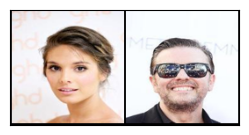

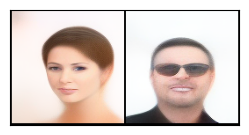

In [88]:
# random_imgs, labels = get_random_images_w_labels(celeba, n=2) #type:ignore
itr = iter(eval_loader)
for _ in range(13): next(itr)
random_imgs, labels = next(itr)
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

In [111]:
labels

tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]])

In [67]:
with torch.no_grad():
    print((nested_gmm.posterior(vae.encode(random_imgs[0].cuda())).cpu() * labels[0]).sum())

tensor(1.0000)


In [76]:
with torch.no_grad():
    print(cross_entropy(nested_gmm.posterior(vae.encode(random_imgs[0].cuda())).cpu(), labels[0] / labels[0].sum()))

tensor(3.3395)


In [44]:
print([name for name, l in zip(attribute_names, labels[1]) if l])

['Attractive', 'Blond_Hair', 'No_Beard', 'Oval_Face', 'Smiling', 'Straight_Hair', 'Wearing_Lipstick', 'Young']


In [62]:
print([name for name, l in zip(attribute_names, labels[0].bool() & labels[1].bool()) if l])

['Attractive', 'No_Beard', 'Young']


In [63]:
from attribute_prediction_model_new.model import model as attribute_model
attribute_model.load_state_dict(torch.load('attribute_prediction_model_new/checkpoints/best_checkpoint.pt')['model_state_dict'])
attribute_model = attribute_model.cuda()

/tmp/user/5678/ipykernel_3771600/4192074654.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  attribute_model.load_state_dict(torch.load('attribute_prediction_model_new/ch

In [73]:
class BinaryPredictionManifold(PullbackRiemannianManifold):
    def coordinate_map(self, coords: torch.Tensor) -> torch.Tensor:
        return attribute_model(vae.decode(coords))
M_attr = BinaryPredictionManifold()

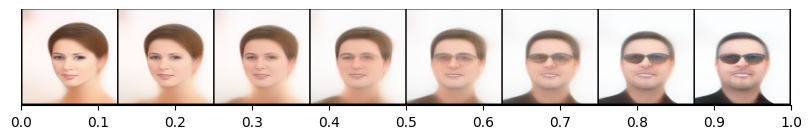

In [89]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

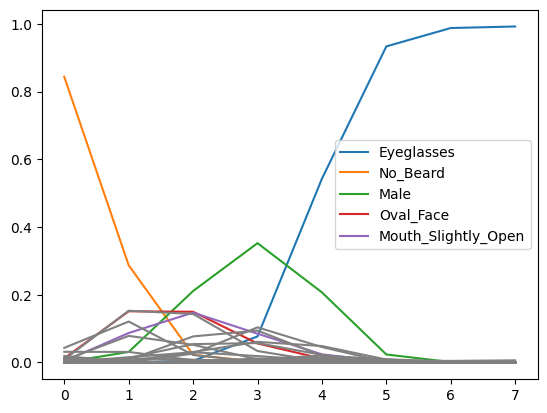

In [90]:
show_posterior(linline, nested_gmm.log_posterior, top_n_labels=5)

optimizing geodesic:   0%|          | 32/10000 [00:00<00:32, 310.60it/s, loss=1.47]

optimizing geodesic: 100%|██████████| 10000/10000 [00:31<00:00, 316.08it/s, loss=0.449]


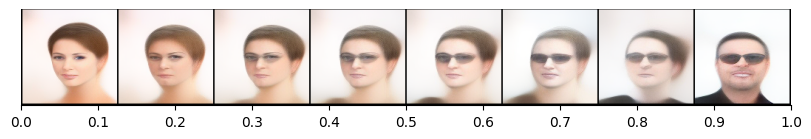

In [91]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

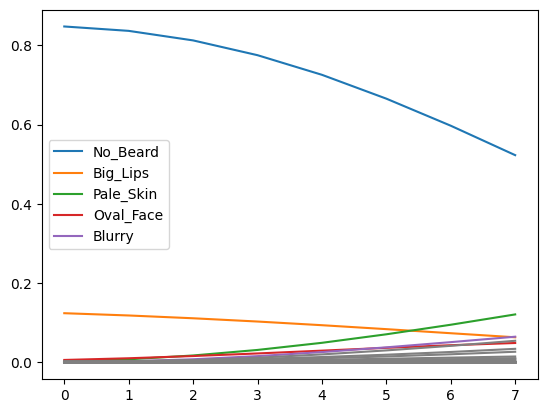

In [70]:
show_posterior(geodesic, nested_gmm.log_posterior, top_n_labels=5)

optimizing geodesic:   0%|          | 0/300 [00:00<?, ?it/s]

optimizing geodesic: 100%|██████████| 300/300 [05:08<00:00,  1.03s/it, loss=0.966]


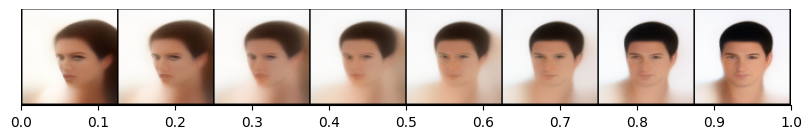

In [84]:
attr_geodesic = M_attr.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=300)
show_latent_curve(attr_geodesic)

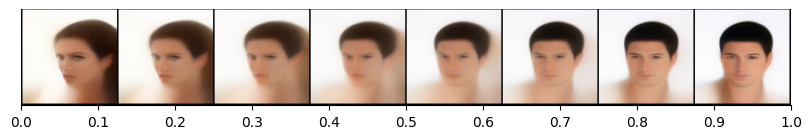

In [85]:
show_latent_curve(linline)

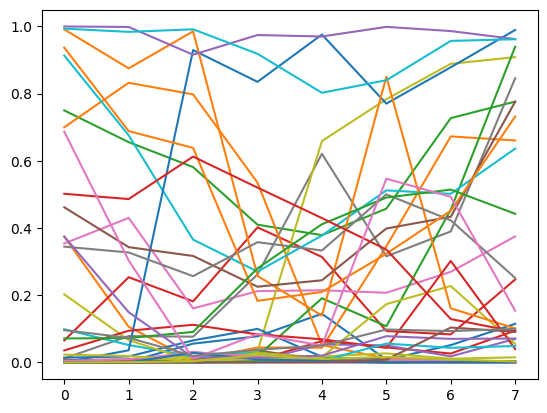

In [86]:
with torch.inference_mode():
    plt.plot(attribute_model(vae.decode(linline.cuda())).cpu())

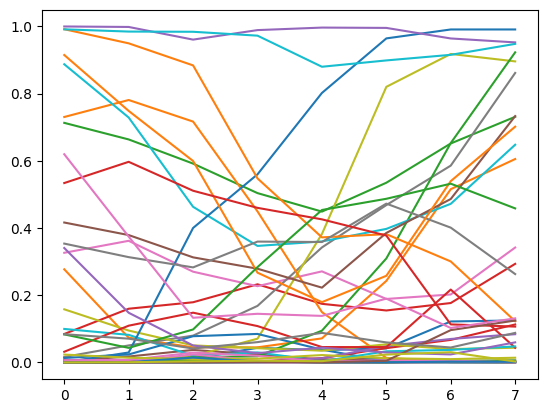

In [87]:
with torch.inference_mode():
    plt.plot(attribute_model(vae.decode(attr_geodesic.cuda())).cpu())

In [71]:
with torch.inference_mode():
    print("True positive")
    print("Linline: ", curve_true_pos(linline.cuda(), lambda x: attribute_model(vae.decode(x)), labels[0].cuda(), labels[1].cuda()).cpu())
    print("Geodesic: ", curve_true_pos(geodesic.cuda(), lambda x: attribute_model(vae.decode(x)), labels[0].cuda(), labels[1].cuda()).cpu())

True positive
Linline:  tensor(10.8507)
Geodesic:  tensor(10.9142)


In [72]:
with torch.inference_mode():
    print("False positive")
    print("Linline: ", curve_false_pos(linline.cuda(), lambda x: attribute_model(vae.decode(x)), labels[0].cuda(), labels[1].cuda()).cpu())
    print("Geodesic: ", curve_false_pos(geodesic.cuda(), lambda x: attribute_model(vae.decode(x)), labels[0].cuda(), labels[1].cuda()).cpu())

False positive
Linline:  tensor(42.9226)
Geodesic:  tensor(41.7919)


In [106]:
curve_true_pos(linline.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda()).cpu()

tensor(2.2593, grad_fn=<ToCopyBackward0>)

In [107]:
curve_true_pos(geodesic.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda()).cpu()

tensor(6.1963)

In [108]:
curve_false_pos(linline.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda()).cpu()

tensor(4.8431, grad_fn=<ToCopyBackward0>)

In [109]:
curve_false_pos(geodesic.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda()).cpu()

tensor(0.9040)

optimizing ebm geodesic: 100%|██████████| 1000/1000 [00:04<00:00, 233.78it/s, loss=-4.77]


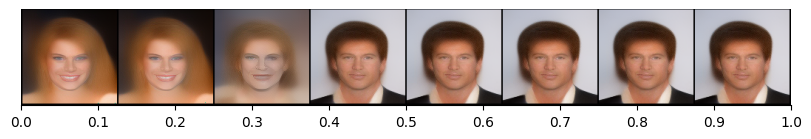

In [20]:
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)

optimizing geodesic:   0%|          | 0/100 [00:00<?, ?it/s]

optimizing geodesic: 100%|██████████| 100/100 [01:37<00:00,  1.02it/s, loss=480]


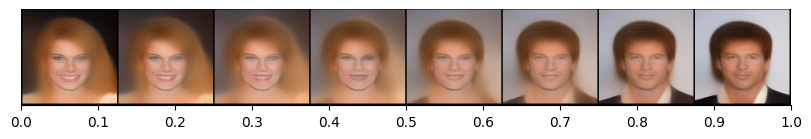

In [24]:
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100)
show_latent_curve(dec_geodesic)

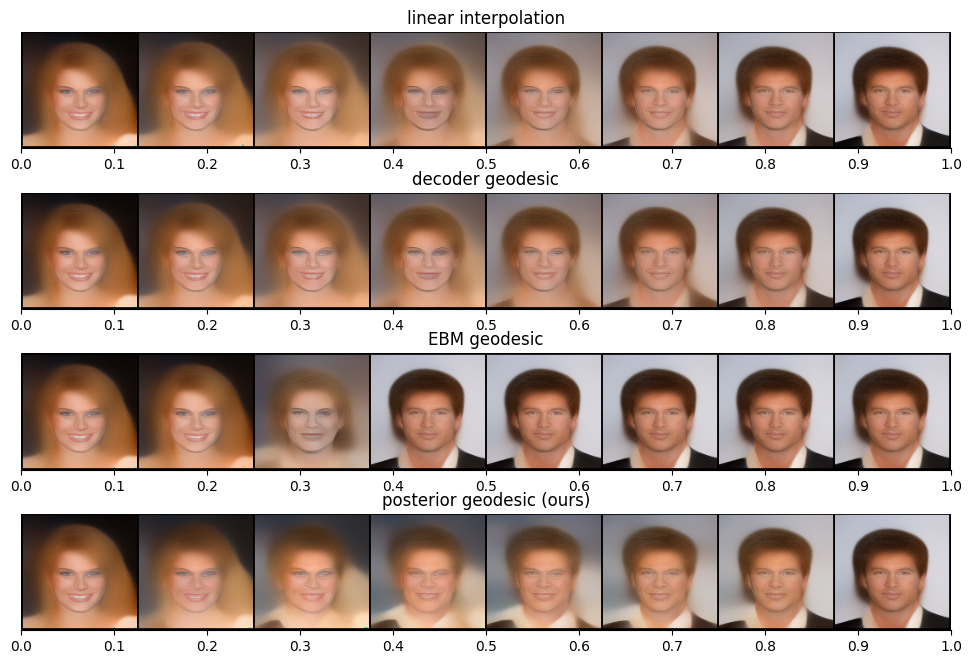

In [27]:
_, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))
show_latent_curve(linline, 'linear interpolation', ax=ax1)
show_latent_curve(dec_geodesic, 'decoder geodesic', ax=ax2)
show_latent_curve(ebm_geodesic, 'EBM geodesic', ax=ax3)
show_latent_curve(geodesic, 'posterior geodesic (ours)', ax=ax4)
plt.show()

In [36]:
def slerp_curve(u, v, n=8):
    t = torch.linspace(0, 1, n, device=u.device)[:, None]
    l1 = torch.norm(u)
    l2 = torch.norm(v)
    u_normed, v_normed = u / l1, v / l2
    omega = torch.arccos(torch.dot(u_normed, v_normed))
    return (
        (torch.sin((1-t) * omega) / torch.sin(omega)) * u
        + (torch.sin(t * omega) / torch.sin(omega)) * v
    )

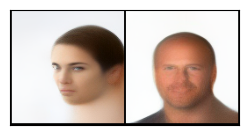

In [11]:
random_imgs = get_random_images(celeba, n=2) #type:ignore
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

In [26]:
torch.exp(-nested_gmm.log_prob(vae.encode(random_imgs[0].cuda())).cpu().detach())

tensor(1.6997e+31)

optimizing ebm geodesic:   0%|          | 0/1000 [00:00<?, ?it/s, loss=226]

optimizing ebm geodesic: 100%|██████████| 1000/1000 [00:03<00:00, 298.39it/s, loss=218]


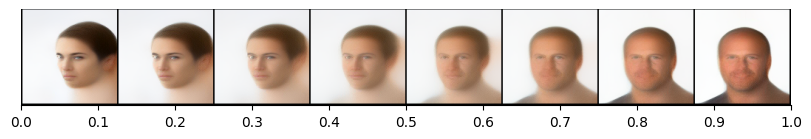

In [39]:
ebm_geodesic = optimize_ebm_geodesic_new(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_subdiv=3, n_iter=1000)
show_latent_curve(ebm_geodesic)

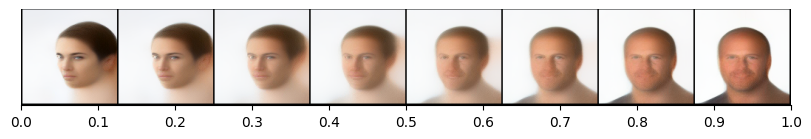

In [15]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

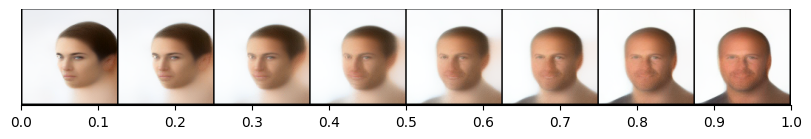

In [37]:
slinline = slerp_curve(*vae.encode(random_imgs), n=8)
show_latent_curve(slinline)

In [16]:
from conformal_ebm_new import ebm_curve_energy

In [17]:
ebm_curve_energy(linline.cuda(), nested_gmm.log_prob).cpu().detach()

tensor(906.7397)

In [18]:
ebm_curve_energy(ebm_geodesic.cuda(), nested_gmm.log_prob).cpu().detach()

tensor(872.7941)

In [20]:
-nested_gmm.log_prob(linline.cuda()).cpu()

tensor([90.7324, 81.9554, 75.0464, 68.9662, 64.3540, 62.4497, 63.6578, 68.0446],
       grad_fn=<NegBackward0>)

In [19]:
-nested_gmm.log_prob(ebm_geodesic.cuda()).cpu()

tensor([90.7324, 80.6148, 71.8796, 63.5830, 57.2152, 55.5428, 59.7179, 68.0446])

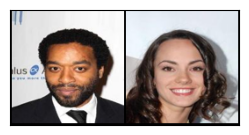

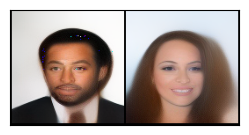

In [50]:
while True:
    random_imgs = get_random_images(celeba, n=2) #type:ignore
    if torch.all(random_imgs.mean(dim=(1, 2, 3)) >= .5): break
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

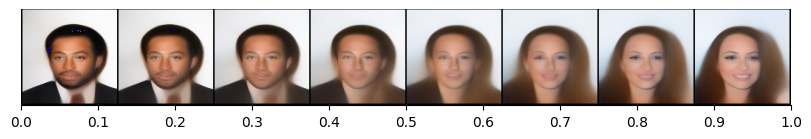

In [51]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

optimizing geodesic: 100%|██████████| 10000/10000 [00:33<00:00, 300.30it/s, loss=0.719]


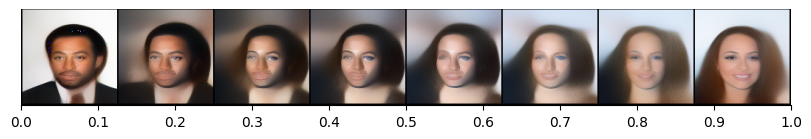

In [52]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

In [ ]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100)
show_latent_curve(dec_geodesic)
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

In [12]:
from torchvision.datasets import VisionDataset
def get_random_images_w_labels(dataset: VisionDataset, n=3):
    loader = DataLoader(dataset, batch_size=n, shuffle=True)
    imgs, labels = next(iter(loader))
    return imgs, labels
def get_two_bright_images_w_labels(brightness_threshold = 0.5):
    while True:
        random_imgs, labels = get_random_images_w_labels(celeba, n=2) #type:ignore
        if torch.all(random_imgs.mean(dim=(1, 2, 3)) >= brightness_threshold): return random_imgs, labels

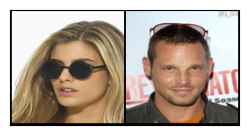

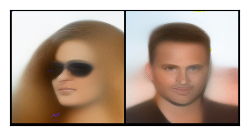

In [64]:
random_imgs = get_two_bright_images()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

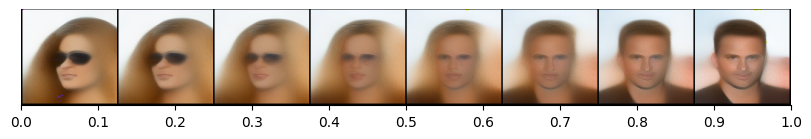

In [65]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

optimizing geodesic: 100%|██████████| 10000/10000 [00:32<00:00, 308.98it/s, loss=0.477]


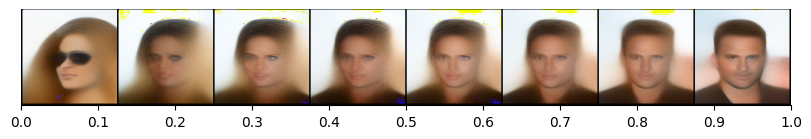

In [66]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

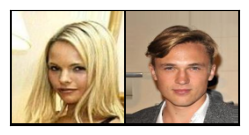

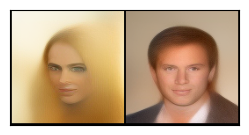

In [95]:
random_imgs = get_two_bright_images()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

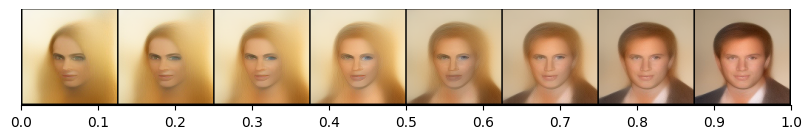

In [96]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

optimizing geodesic: 100%|██████████| 10000/10000 [00:33<00:00, 302.21it/s, loss=0.343]


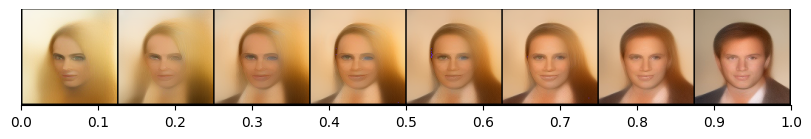

In [97]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

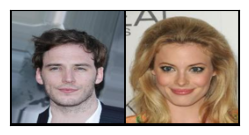

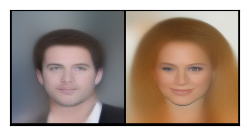

In [277]:
# random_imgs = get_two_bright_images()
random_imgs = torch.stack((get_random_image(celeba), random_imgs[1]))
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

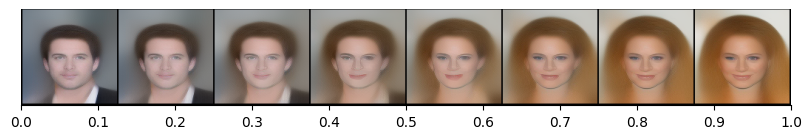

In [278]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

optimizing geodesic:   0%|          | 29/10000 [00:00<00:35, 281.74it/s, loss=1.62]

optimizing geodesic: 100%|██████████| 10000/10000 [00:32<00:00, 303.23it/s, loss=0.393]


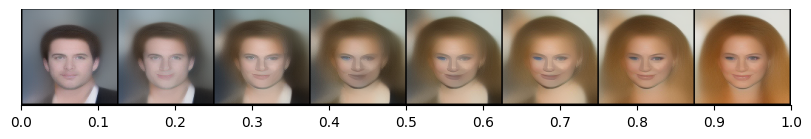

In [279]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

optimizing ebm geodesic: 100%|██████████| 1000/1000 [00:03<00:00, 259.18it/s, loss=-7.66]


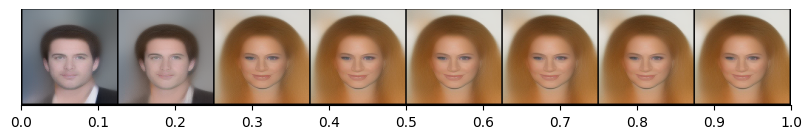

In [280]:
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)

optimizing geodesic: 100%|██████████| 100/100 [01:37<00:00,  1.02it/s, loss=131]


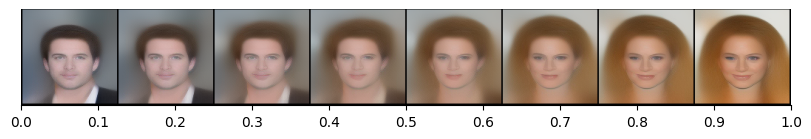

In [281]:
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100, lr=0.05)
show_latent_curve(dec_geodesic)

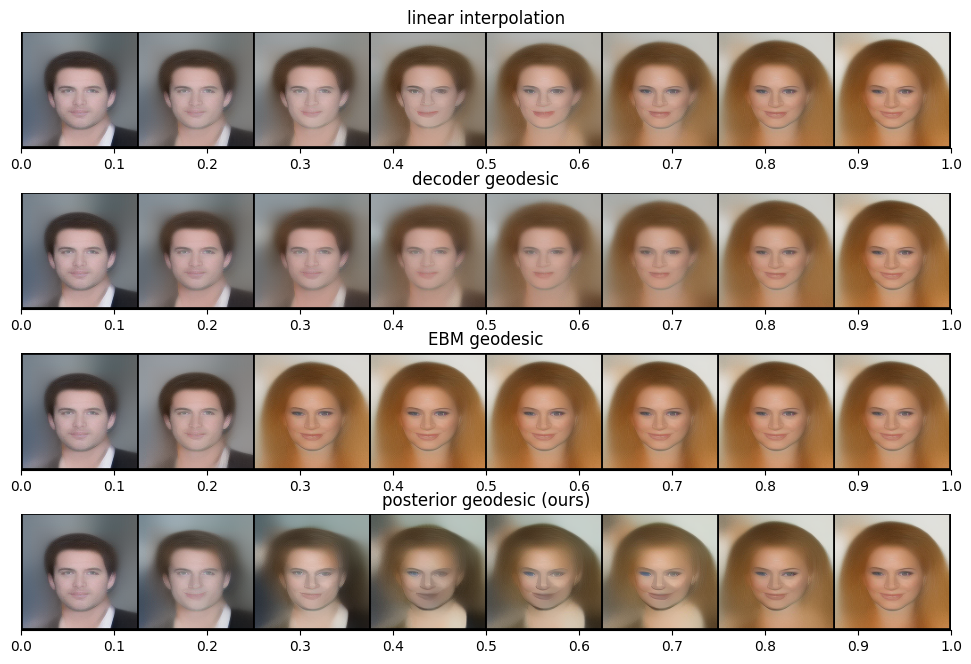

In [282]:
_, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))
show_latent_curve(linline, 'linear interpolation', ax=ax1)
show_latent_curve(dec_geodesic, 'decoder geodesic', ax=ax2)
show_latent_curve(ebm_geodesic, 'EBM geodesic', ax=ax3)
show_latent_curve(geodesic, 'posterior geodesic (ours)', ax=ax4)
plt.show()

In [ ]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100)
show_latent_curve(dec_geodesic)
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

### First testing w/ evaluation metrics

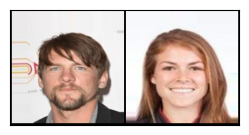

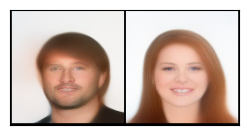

In [29]:
random_imgs, labels = get_two_bright_images_w_labels()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))

In [ ]:
def show_posterior(curve: torch.Tensor, log_posterior, title=None, ax=None, top_n_labels: int | None = None):
    with torch.no_grad():
        posterior = torch.exp(log_posterior(curve.cuda()).cpu())
    if not ax:
        fig = plt.figure()
        ax = fig.add_subplot()
    if top_n_labels:
        prominence = posterior.sum(dim=0)
        order = prominence.sort(descending=True).indices
        top, others = order[:top_n_labels], order[top_n_labels:]
        ax.plot(
            posterior[:, top],
            label=[attribute_names[i] for i in top]
        )
        ax.plot(posterior[:, others], c='gray')
        ax.legend()
    else:
        ax.plot(posterior)
    if title: ax.set_title(title)

In [43]:
def show_posterior_w_highlighted(curve, log_posterior, labelsA, labelsB, mode, ax=None):
    with torch.no_grad():
        posterior = torch.exp(log_posterior(curve.cuda()).cpu())
    if not ax:
        fig = plt.figure()
        ax = fig.add_subplot()
    match mode:
        case 'true_pos':
            mask = (labelsA.bool() & labelsB.bool())
        case 'false_pos':
            mask = ~(labelsA.bool() | labelsB.bool())
        case _: raise NotImplementedError()
    ax.plot(posterior[:, mask])
    ax.plot(posterior[:, ~mask], c='gray')
    

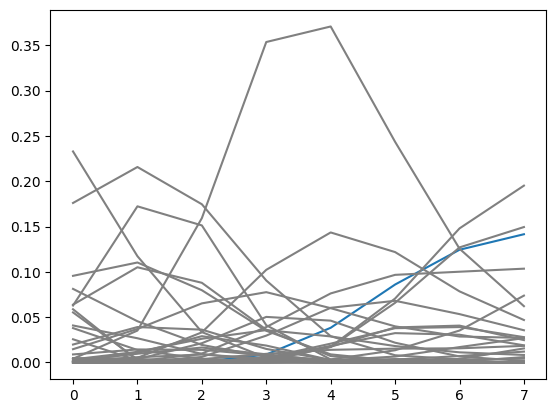

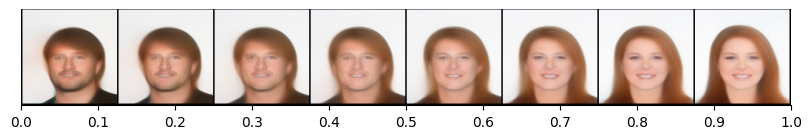

In [44]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_posterior_w_highlighted(linline, nested_gmm.log_posterior, labels[0], labels[1], 'true_pos')
show_latent_curve(linline)

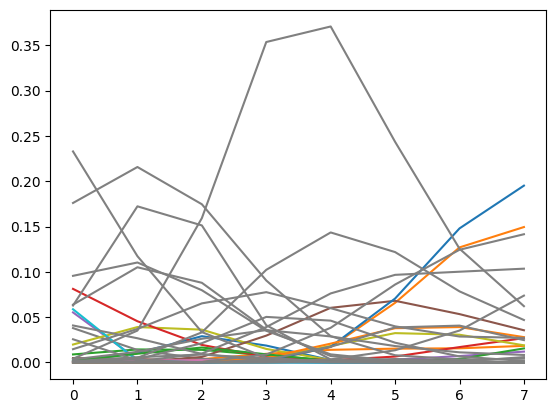

In [55]:
show_posterior_w_highlighted(linline, nested_gmm.log_posterior, labels[0], labels[1], 'false_pos')

In [45]:
print([name for name, b in zip(attribute_names, (labels[0].bool() & labels[1].bool())) if b])

['Brown_Hair']


In [40]:
print([name for name, b in zip(attribute_names, ~(labels[0].bool() | labels[1].bool())) if b])

['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Bags_Under_Eyes', 'Bald', 'Big_Lips', 'Black_Hair', 'Blurry', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Gray_Hair', 'Heavy_Makeup', 'Narrow_Eyes', 'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline', 'Rosy_Cheeks', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick', 'Wearing_Necklace', 'Wearing_Necktie']


In [35]:
~(labels[0].bool() | labels[1].bool())

tensor([ True,  True, False,  True,  True, False,  True, False,  True, False,
         True, False, False,  True,  True,  True, False,  True,  True, False,
        False, False, False,  True, False,  True,  True,  True,  True,  True,
        False, False, False, False,  True,  True,  True,  True,  True, False])

In [46]:
curve_true_pos(linline.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda())

tensor(0.4000, device='cuda:0', grad_fn=<SumBackward0>)

In [59]:
curve_false_pos(linline.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda())

tensor(2.0969, device='cuda:0', grad_fn=<SumBackward0>)

optimizing geodesic:   7%|▋         | 666/10000 [00:02<00:30, 309.39it/s, loss=0.464]

optimizing geodesic: 100%|██████████| 10000/10000 [00:32<00:00, 304.36it/s, loss=0.413]


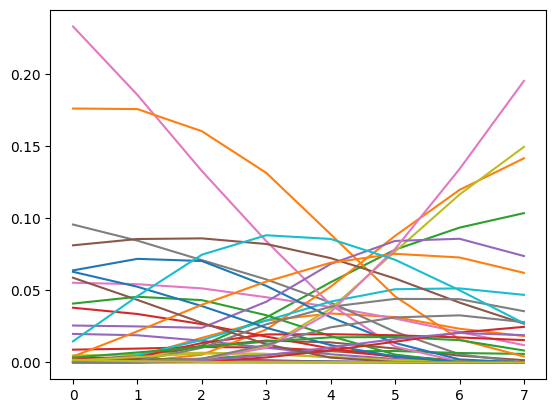

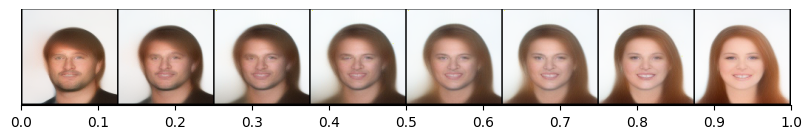

In [33]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_posterior(geodesic, nested_gmm.log_posterior)
show_latent_curve(geodesic)

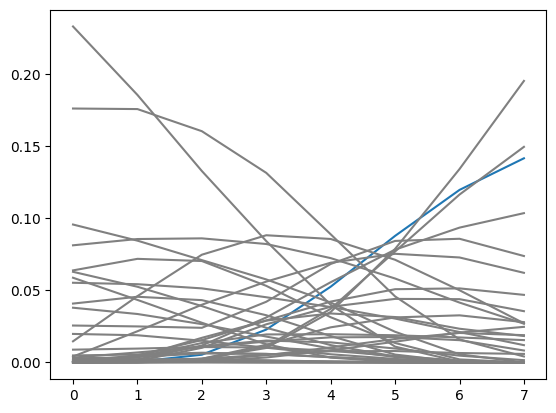

In [53]:
show_posterior_w_highlighted(geodesic, nested_gmm.log_posterior, labels[0], labels[1], 'true_pos')

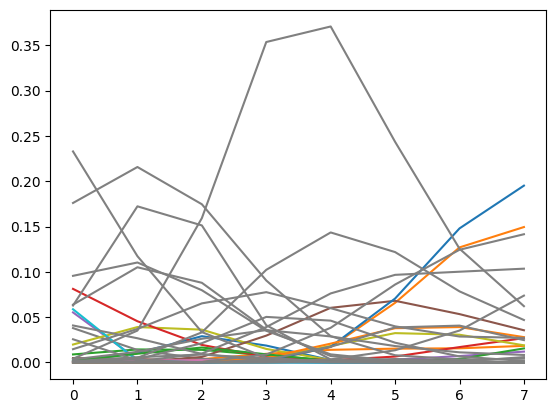

In [58]:
show_posterior_w_highlighted(linline, nested_gmm.log_posterior, labels[0], labels[1], 'false_pos')

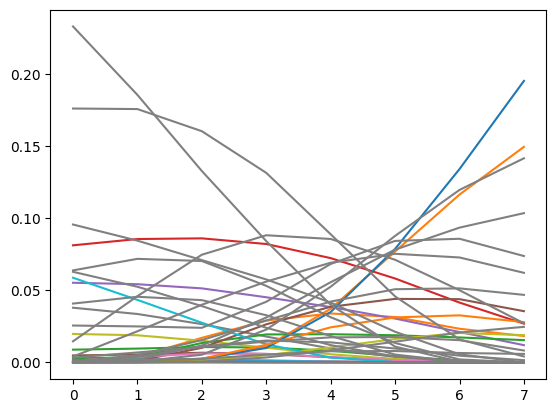

In [57]:
show_posterior_w_highlighted(geodesic, nested_gmm.log_posterior, labels[0], labels[1], 'false_pos')

In [54]:
curve_true_pos(geodesic.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda())

tensor(0.4303, device='cuda:0')

In [60]:
curve_false_pos(geodesic.cuda(), nested_gmm.posterior, labels[0].cuda(), labels[1].cuda())

tensor(2.8488, device='cuda:0')

In [ ]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100)
show_latent_curve(dec_geodesic)
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

## Karcher mean!

In [39]:
def compare_means():
    fig = plt.figure()
    gs0 = fig.add_gridspec(2, 1)
    gsb = gs0[1].subgridspec(1, 2)
    axt = fig.add_subplot(gs0[0])
    axbl = fig.add_subplot(gsb[0])
    axbr = fig.add_subplot(gsb[1])

    show_img(make_grid(vae.reconstruct(random_imgs)), ax=axt)
    axt.set_title('Reconstructed images')

    global eucl_mean, karcher_mean
    eucl_mean = vae.encode(random_imgs).mean(0).detach()
    karcher_mean = M.optimize_Karcher_mean(*vae.encode(random_imgs.cuda()), n_segments=8, n_iter=5000, n_subdiv=3).detach().cpu()

    show_img(vae.decode(eucl_mean).detach(), ax=axbl)
    axbl.set_title('Euclidian mean')
    show_img(vae.decode(karcher_mean).detach(), ax=axbr)
    axbr.set_title('Posterior mean')

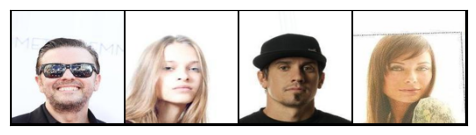

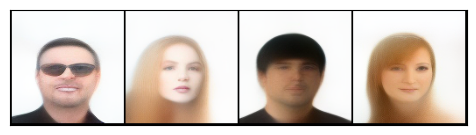

In [13]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

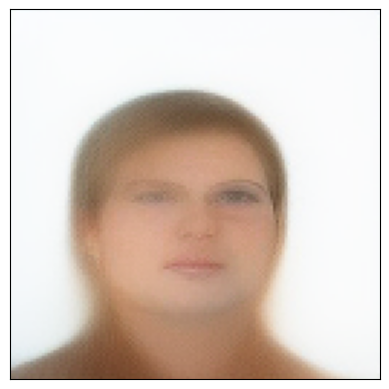

In [15]:
show_img(vae.decode(vae.encode(random_imgs).mean(0)))

optimizing Karcher mean:   0%|          | 0/5000 [00:00<?, ?it/s]

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:49<00:00, 101.78it/s, loss=14.9]


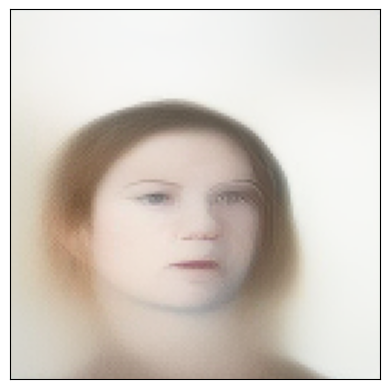

In [17]:
show_img(vae.decode(M.optimize_Karcher_mean(*vae.encode(random_imgs.cuda()), n_segments=8, n_iter=5000, n_subdiv=3)).cpu())

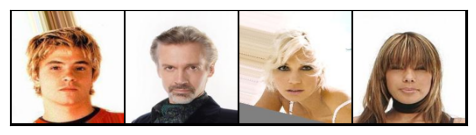

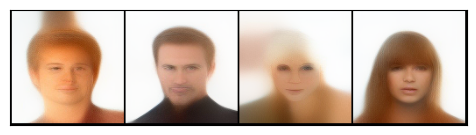

In [18]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

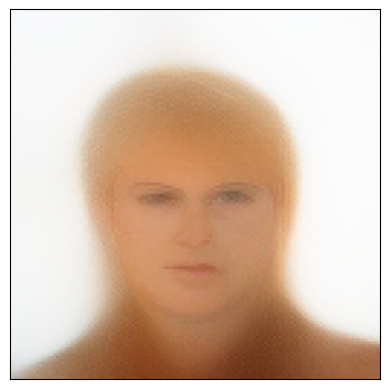

In [19]:
show_img(vae.decode(vae.encode(random_imgs).mean(0)))

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:48<00:00, 102.79it/s, loss=12.9]


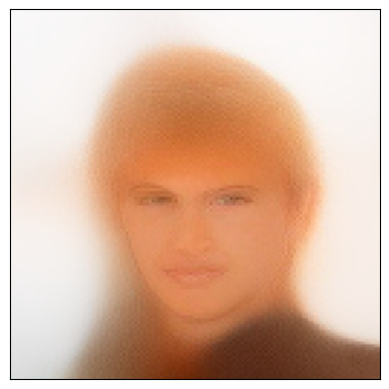

In [20]:
show_img(vae.decode(M.optimize_Karcher_mean(*vae.encode(random_imgs.cuda()), n_segments=8, n_iter=5000, n_subdiv=3)).cpu())

In [114]:
def compare_means():
    fig = plt.figure()
    gs0 = fig.add_gridspec(2, 1)
    gsb = gs0[1].subgridspec(1, 2)
    axt = fig.add_subplot(gs0[0])
    axbl = fig.add_subplot(gsb[0])
    axbr = fig.add_subplot(gsb[1])

    show_img(make_grid(vae.reconstruct(random_imgs)), ax=axt)
    axt.set_title('Reconstructed images')

    global eucl_mean, karcher_mean
    eucl_mean = vae.encode(random_imgs).mean(0).detach()
    karcher_mean = M.optimize_Karcher_mean(*vae.encode(random_imgs.cuda()), n_segments=8, n_iter=5000, n_subdiv=3).detach().cpu()

    show_img(vae.decode(eucl_mean).detach(), ax=axbl)
    axbl.set_title('Euclidian mean')
    show_img(vae.decode(karcher_mean).detach(), ax=axbr)
    axbr.set_title('Posterior mean')
    plt.show()

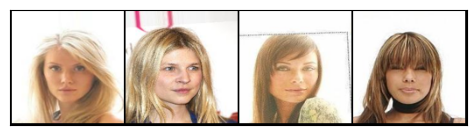

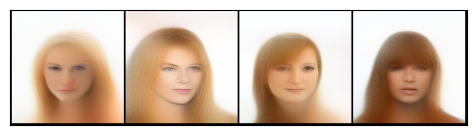

In [32]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:48<00:00, 102.55it/s, loss=9.43]


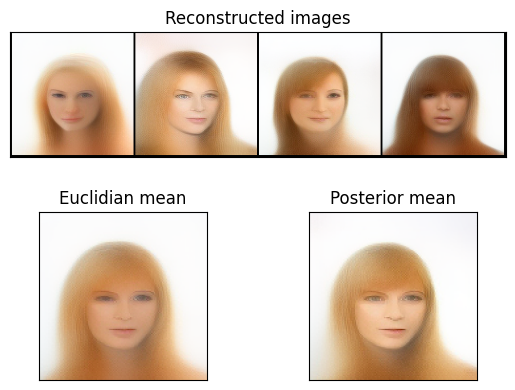

In [33]:
compare_means()

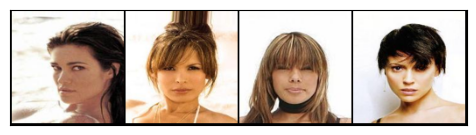

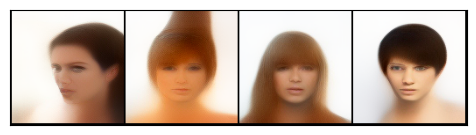

In [36]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:50<00:00, 99.78it/s, loss=7.89] 


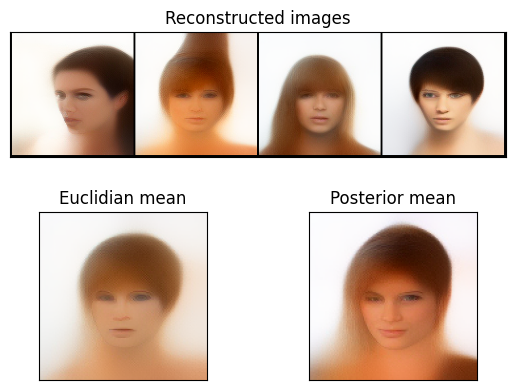

In [40]:
compare_means()

In [123]:
with torch.inference_mode():
    avg_post = nested_gmm.posterior(vae.encode(random_imgs.cuda())).mean(0).cpu()
    eucl_post = nested_gmm.log_posterior(eucl_mean.cuda()).cpu()
    karcher_post = nested_gmm.log_posterior(karcher_mean.cuda()).cpu()
    print("Cross entropy mean vs averaged posteriors:")
    print("Euclidian mean: ", cross_entropy(eucl_post, avg_post, reduction='sum').item())
    print("Karcher mean: ", cross_entropy(karcher_post, avg_post, reduction='sum').item())

Cross entropy mean vs averaged posteriors:
Euclidian mean:  7.025096416473389
Karcher mean:  3.482369899749756


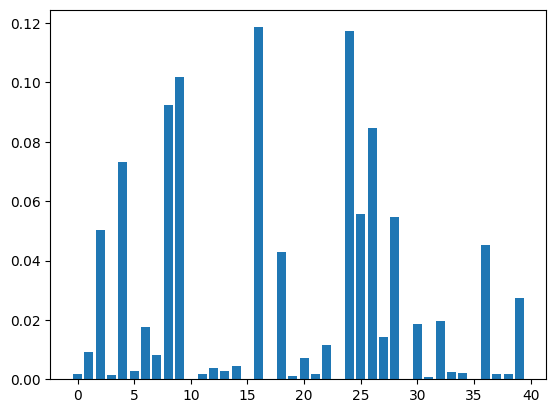

In [119]:
with torch.inference_mode():
    plt.bar(np.arange(40), nested_gmm.posterior(vae.encode(random_imgs.cuda())).mean(0).cpu())

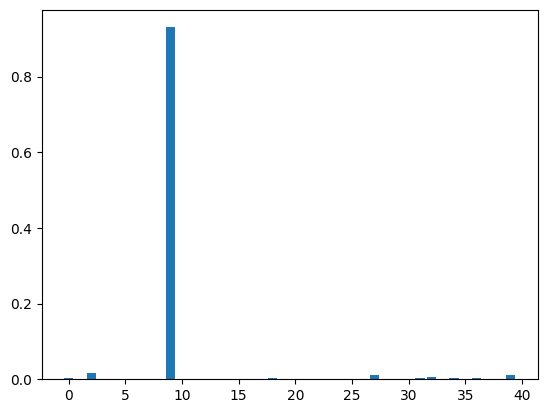

In [120]:
with torch.inference_mode():
    plt.bar(np.arange(40), nested_gmm.posterior(eucl_mean.cuda()).cpu())

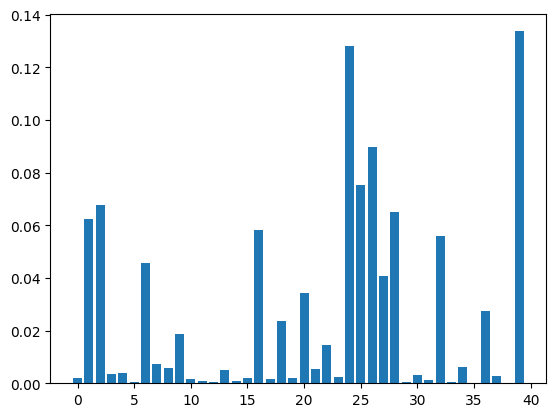

In [121]:
with torch.inference_mode():
    plt.bar(np.arange(40), nested_gmm.posterior(karcher_mean.cuda()).cpu())

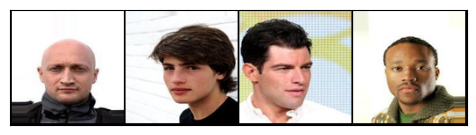

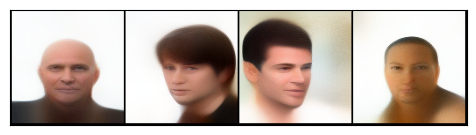

In [62]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:48<00:00, 102.53it/s, loss=18.1]


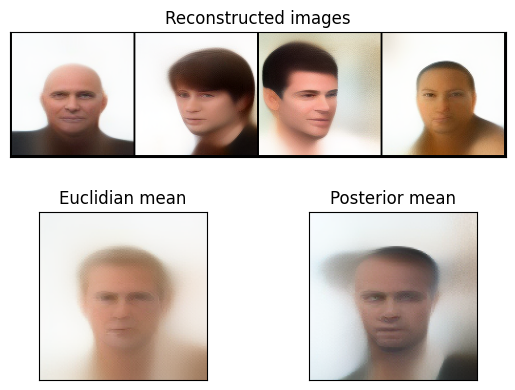

In [63]:
compare_means()

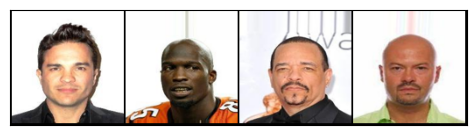

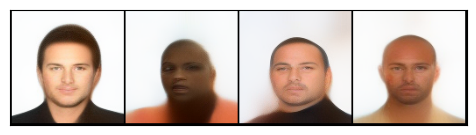

In [109]:
random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
show_img(make_grid(random_imgs), figsize=(6, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(6, 1.5))

optimizing Karcher mean:   3%|▎         | 141/5000 [00:01<00:48, 99.45it/s, loss=19.6] 

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:50<00:00, 99.89it/s, loss=12.3] 


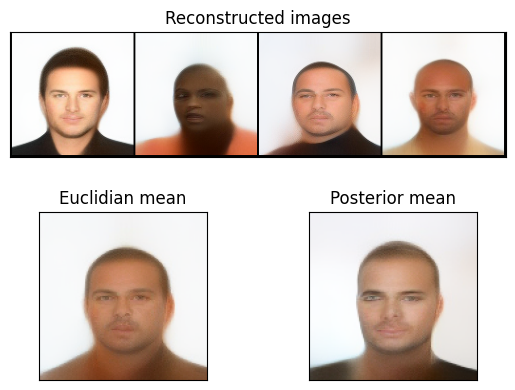

In [111]:
# show_img(vae.decode(vae.encode(random_imgs).mean(0)))
compare_means()

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:51<00:00, 96.68it/s, loss=14]   


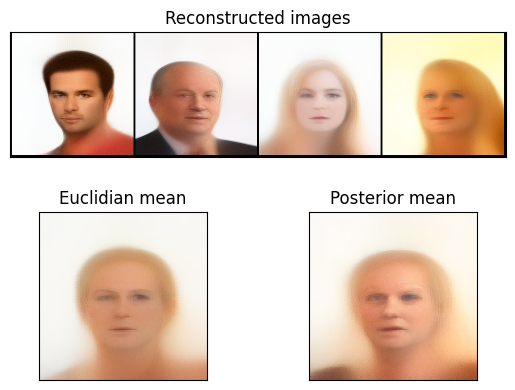

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:52<00:00, 95.60it/s, loss=10.7] 


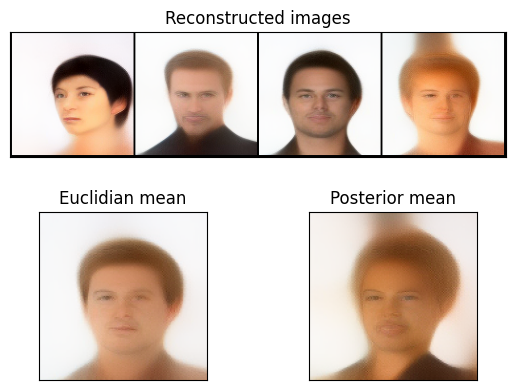

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:52<00:00, 95.61it/s, loss=15.2] 


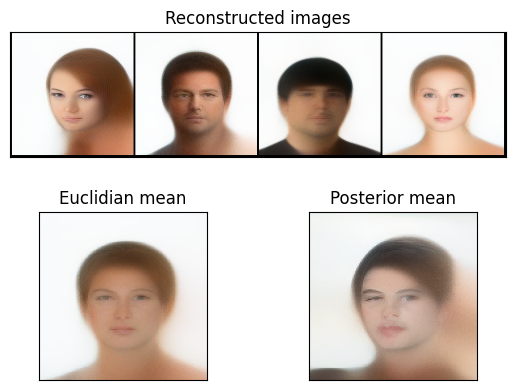

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:52<00:00, 95.62it/s, loss=20.4] 


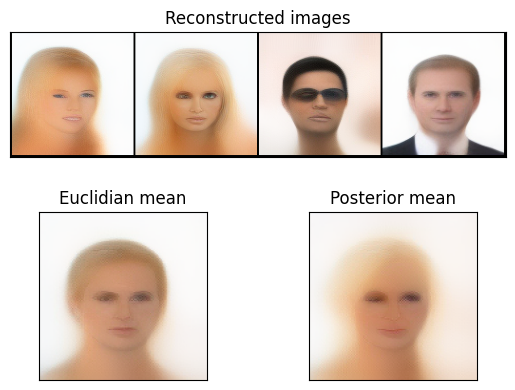

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:52<00:00, 96.15it/s, loss=11.2] 


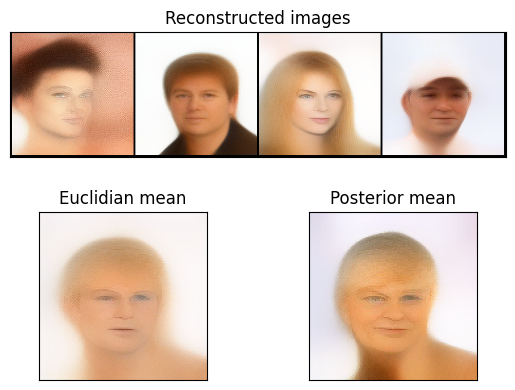

optimizing Karcher mean: 100%|██████████| 5000/5000 [00:53<00:00, 93.68it/s, loss=19.3] 


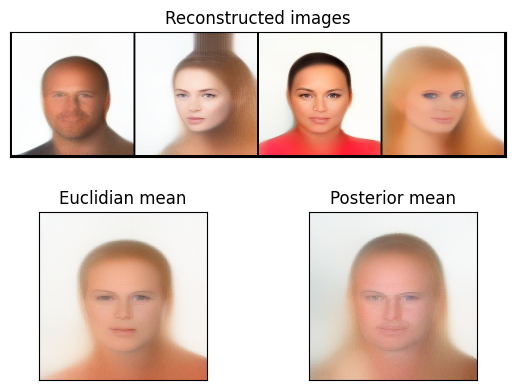

In [115]:
for _ in range(6):
    random_imgs, labels = get_random_images_w_labels(celeba, n=4) #type:ignore
    compare_means()

## Experimenting with attribute prediction model

In [17]:
from attribute_prediction_model.model import model as attribute_model
attribute_model.load_state_dict(torch.load('attribute_prediction_model/checkpoints/best_checkpoint.pt')['model_state_dict'])

/tmp/user/5678/ipykernel_3690518/1874631434.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  attribute_model.load_state_dict(torch.load('attribute_prediction_model/checkp

<All keys matched successfully>

In [19]:
with torch.no_grad():
    print(attribute_model(torch.zeros(1, 3, 128, 128)) == attribute_model(torch.zeros(1, 3, 128, 128)))

tensor([[True, True, True, True, True, True, True, True, True, True, True, True,
         True, True, True, True, True, True, True, True, True, True, True, True,
         True, True, True, True, True, True, True, True, True, True, True, True,
         True, True, True, True]])


73 / 80


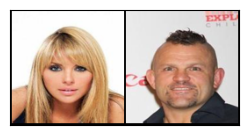

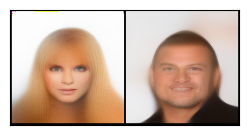

In [116]:
random_imgs, labels = get_two_bright_images_w_labels()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))
print(f'{torch.sum((attribute_model(random_imgs) > .5) == labels).item()} / 80')

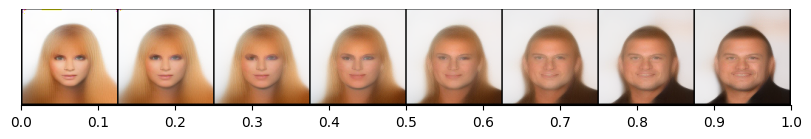

In [117]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

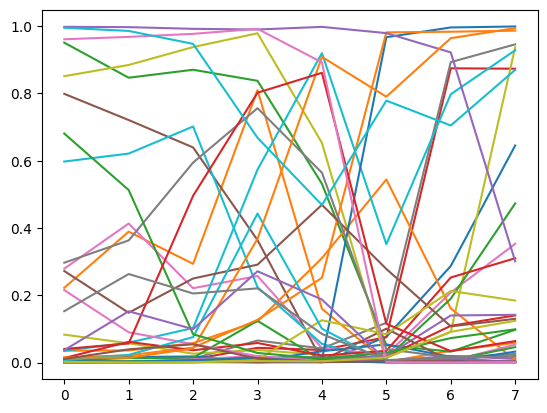

In [119]:
linline_preds = attribute_model(vae.decode(linline)).detach()
plt.plot(linline_preds)
plt.show()

optimizing geodesic:   0%|          | 29/10000 [00:00<00:34, 286.96it/s, loss=1.68]

optimizing geodesic: 100%|██████████| 10000/10000 [00:33<00:00, 301.87it/s, loss=0.584]


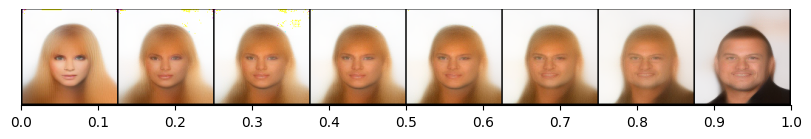

In [118]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

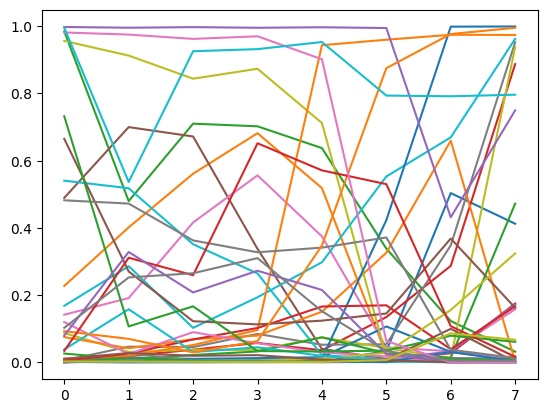

In [120]:
geodesic_preds = attribute_model(vae.decode(geodesic)).detach()
plt.plot(geodesic_preds)
plt.show()
# show_posterior

In [122]:
curve_false_pos(linline, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(20.0035, grad_fn=<SumBackward0>)

In [123]:
curve_false_pos(geodesic, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(19.1990, grad_fn=<SumBackward0>)

In [124]:
curve_true_pos(linline, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(3.4119, grad_fn=<SumBackward0>)

In [125]:
curve_true_pos(geodesic, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(4.0324, grad_fn=<SumBackward0>)

In [ ]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)
ebm_geodesic = optimize_ebm_geodesic(*vae.encode(random_imgs), log_likelihood=nested_gmm.log_prob, n_segments=8, n_iter=1000)
show_latent_curve(ebm_geodesic)
dec_geodesic = M_Dec.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=100)
show_latent_curve(dec_geodesic)
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

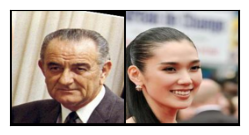

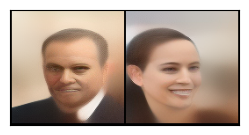

In [41]:
random_imgs, labels = get_two_bright_images_w_labels()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))
# print(f'{torch.sum((attribute_model(random_imgs) > .5) == labels).item()} / 80')

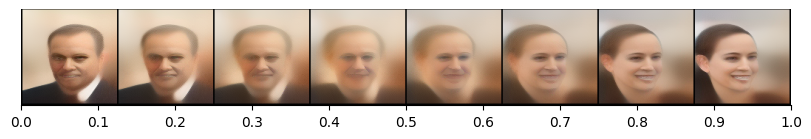

In [42]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

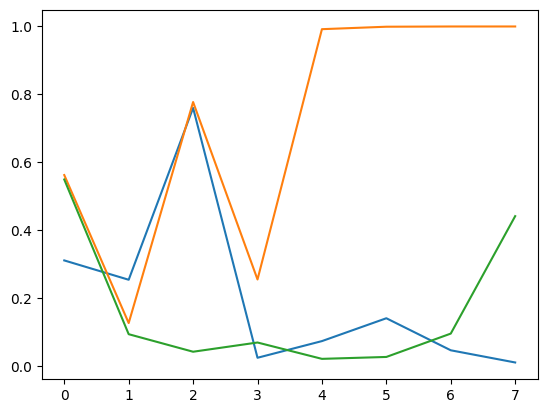

In [53]:
# linline_preds = attribute_model(vae.decode(linline)).detach()
linline_preds = attribute_model(vae.decode(linline))[:, labels[0].bool() & labels[1].bool()].detach()
plt.plot(linline_preds)
plt.show()

optimizing geodesic: 100%|██████████| 10000/10000 [00:33<00:00, 294.50it/s, loss=0.196]


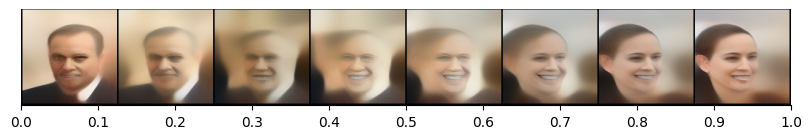

In [44]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

In [68]:
(vae.decode(geodesic)[0] - vae.decode(linline)[0]).abs().mean()

OutOfMemoryError: CUDA out of memory. Tried to allocate 16.00 MiB. GPU 0 has a total capacity of 19.68 GiB of which 9.31 MiB is free. Including non-PyTorch memory, this process has 19.67 GiB memory in use. Of the allocated memory 19.25 GiB is allocated by PyTorch, and 229.59 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

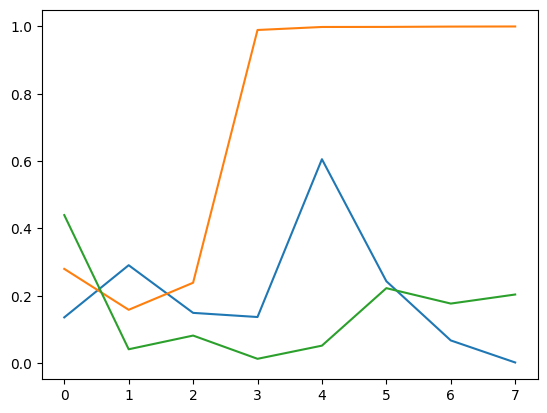

In [54]:
# geodesic_preds = attribute_model(vae.decode(geodesic)).detach()
geodesic_preds = attribute_model(vae.decode(geodesic))[:, labels[0].bool() & labels[1].bool()].detach()
plt.plot(geodesic_preds)
plt.show()

In [46]:
curve_false_pos(linline, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(19.2820, grad_fn=<SumBackward0>)

In [47]:
curve_false_pos(geodesic, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(18.7394, grad_fn=<SumBackward0>)

In [48]:
curve_true_pos(linline, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(8.6770, grad_fn=<SumBackward0>)

In [55]:
curve_true_pos(geodesic, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(8.5221, grad_fn=<SumBackward0>)

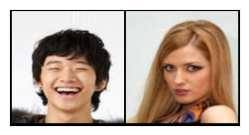

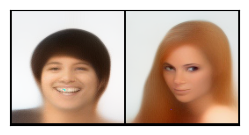

In [20]:
random_imgs, labels = get_two_bright_images_w_labels()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))
# print(f'{torch.sum((attribute_model(random_imgs) > .5) == labels).item()} / 80')

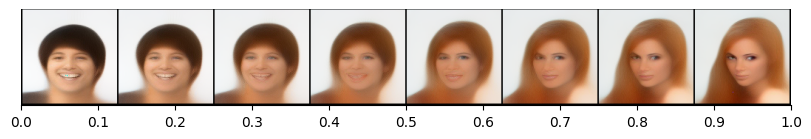

In [21]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

optimizing geodesic:   0%|          | 1/10000 [00:00<24:00,  6.94it/s, loss=2.45]

optimizing geodesic: 100%|██████████| 10000/10000 [00:35<00:00, 285.30it/s, loss=0.455]


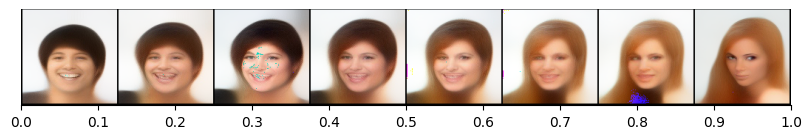

In [22]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

In [30]:
with torch.no_grad():
    print(attribute_model(vae.decode(linline))[0] - attribute_model(vae.decode(geodesic))[0])

tensor([ 0.0831, -0.0020, -0.0356,  0.1501, -0.0009,  0.0028, -0.0223,  0.1742,
         0.0324, -0.0007, -0.0383, -0.0042, -0.0262,  0.0026,  0.0034, -0.0016,
         0.0012, -0.0006, -0.0003,  0.1563,  0.0022, -0.0019, -0.0003, -0.0510,
        -0.1507, -0.0040, -0.0020, -0.0324, -0.0047, -0.0003,  0.0043,  0.0288,
        -0.0498, -0.0046, -0.0008,  0.0182, -0.0005, -0.0058, -0.0009, -0.0071])


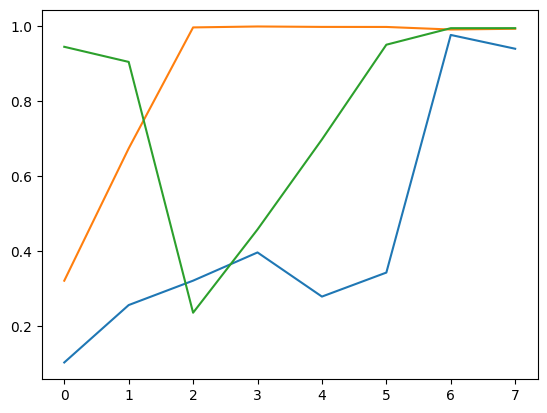

In [23]:
linline_preds = attribute_model(vae.decode(linline))[:, labels[0].bool() & labels[1].bool()].detach()
plt.plot(linline_preds)
plt.show()

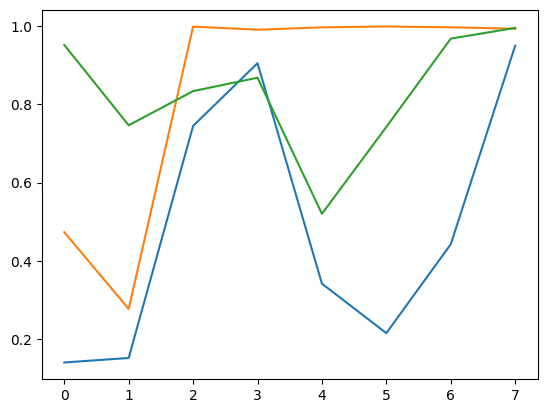

In [24]:
geodesic_preds = attribute_model(vae.decode(geodesic))[:, labels[0].bool() & labels[1].bool()].detach()
plt.plot(geodesic_preds)
plt.show()

In [25]:
curve_true_pos(linline, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(16.7778, grad_fn=<SumBackward0>)

In [26]:
curve_true_pos(geodesic, lambda x: attribute_model(vae.decode(x)), labels[0], labels[1])

tensor(17.2447, grad_fn=<SumBackward0>)

In [38]:
vae.outer.model.eval()

AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (conv1): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (norm2): GroupNorm(32, 128, eps=1e-06, affine=True)
            (dropout): Dropout(p=0.0, inplace=False)
            (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (nonlinearity): SiLU()
          )
        )
        (downsamplers): ModuleList(
          (0): Downsample2D(
            (conv): Conv2d(128, 128, kernel_size=(3, 3), stride=(2, 2))
          )
        )
      )
      (1): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0): ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06, affine=True)
            (c

In [ ]:
torch.use_deterministic_algorithms(True)

In [14]:
with torch.no_grad():
    print(vae.decode(torch.zeros(64)) == vae.decode(torch.zeros(64)))

RuntimeError: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility

In [16]:
torch.use_deterministic_algorithms(False)

## Experimenting with latent attribute prediction model

In [12]:
from latent_attribute_prediction.model import MLP_ELU_convex
attribute_model = MLP_ELU_convex()
attribute_model.load_state_dict(torch.load('latent_attribute_prediction/checkpoints/best_checkpoint.pt')['model_state_dict'])

/tmp/user/5678/ipykernel_3687544/1977692012.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  attribute_model.load_state_dict(torch.load('latent_attribute_prediction/check

<All keys matched successfully>

67 / 80


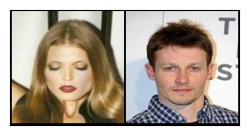

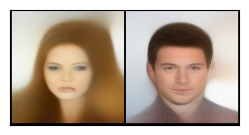

In [18]:
random_imgs, labels = get_two_bright_images_w_labels()
show_img(make_grid(random_imgs), figsize=(3, 1.5))
show_img(make_grid(vae.reconstruct(random_imgs)), figsize=(3, 1.5))
print(f'{torch.sum((attribute_model(vae.encode(random_imgs)) > .5) == labels).item()} / 80')

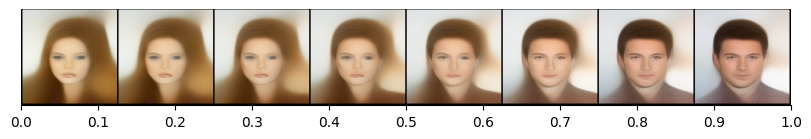

In [19]:
linline = lerp(*vae.encode(random_imgs), n=8)
show_latent_curve(linline)

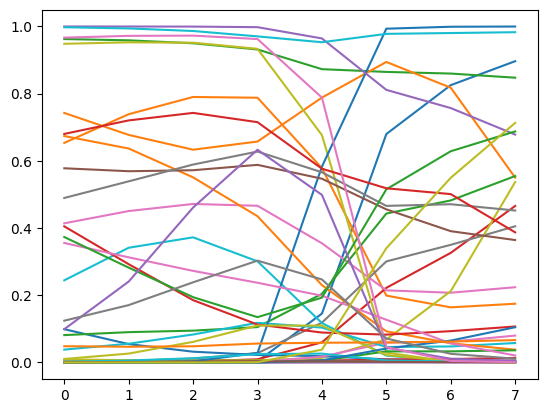

In [20]:
linline_preds = attribute_model(linline).detach()
plt.plot(linline_preds)
plt.show()

optimizing geodesic: 100%|██████████| 10000/10000 [00:34<00:00, 286.95it/s, loss=0.365]


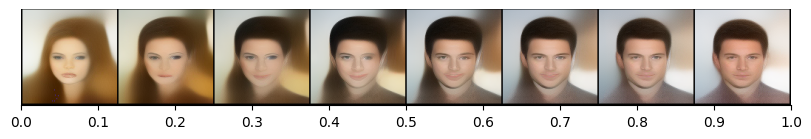

In [21]:
geodesic = M.optimize_geodesic(*vae.encode(random_imgs), n_segments=8, n_subdiv=3, n_iter=10000)
show_latent_curve(geodesic)

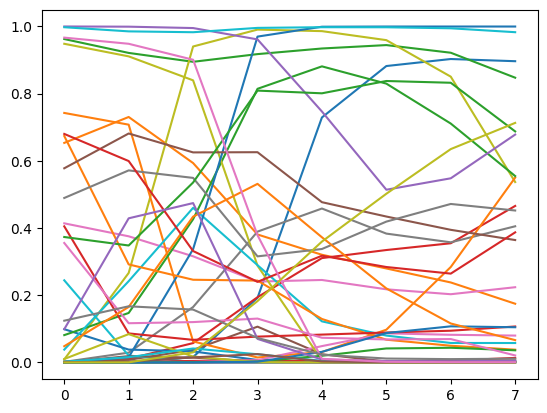

In [22]:
geodesic_preds = attribute_model(geodesic).detach()
plt.plot(geodesic_preds)
plt.show()

In [25]:
curve_false_pos(linline, attribute_model, labels[0], labels[1])

tensor(31.0958, grad_fn=<SumBackward0>)

In [26]:
curve_false_pos(geodesic, attribute_model, labels[0], labels[1])

tensor(36.4381, grad_fn=<SumBackward0>)

In [27]:
curve_true_pos(linline, attribute_model, labels[0], labels[1])

tensor(7.8434, grad_fn=<SumBackward0>)

In [28]:
curve_true_pos(geodesic, attribute_model, labels[0], labels[1])

tensor(7.9348, grad_fn=<SumBackward0>)